## Importing required libraries

In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler, random_split
from torchvision import transforms
from PIL import Image
from os import listdir
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.image import imread
from sklearn.model_selection import train_test_split


## Checking Availability of GPU

In [2]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")



True
Tesla T4


## Exploring the Data Structure of Train Dataset

In [3]:
DATA_ROOT_DIR = r"/kaggle/input/breast-cancer-images/breast cancer images/breast cancer images/IDC_regular_ps50_idx5"
files = listdir(DATA_ROOT_DIR )
print(len(files))
files[0:10]

279


['10295',
 '10304',
 '12868',
 '10274',
 '12818',
 '14190',
 '12869',
 '9323',
 '10291',
 '12906']

In [4]:
total_images = 0
for n in range(len(files)):
    patient_id = files[n]
    for c in [0, 1]:
        patient_path = DATA_ROOT_DIR + "/" + patient_id
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        total_images += len(subfiles)

total_images


277524

In [5]:
train_data = pd.DataFrame(index=np.arange(0, total_images), columns=["patient_id", "path", "target"])

k = 0
for n in range(len(files)):
    patient_id = files[n]
    patient_path = DATA_ROOT_DIR + "/" + patient_id 
    for c in [0,1]:
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        for m in range(len(subfiles)):
            image_path = subfiles[m]
            train_data.loc[k, "path"] = class_path + image_path
            train_data.loc[k, "target"] = c
            train_data.loc[k, "patient_id"] = patient_id
            k += 1  

train_data.head()

,patient_id,path,target
0,10295,/kaggle/input/breast-cancer-images/breast canc...,0
1,10295,/kaggle/input/breast-cancer-images/breast canc...,0
2,10295,/kaggle/input/breast-cancer-images/breast canc...,0
3,10295,/kaggle/input/breast-cancer-images/breast canc...,0
4,10295,/kaggle/input/breast-cancer-images/breast canc...,0


## Clean train_data

In [6]:
train_data = train_data[['path', 'target']].copy()
train_data['path'] = train_data['path'].astype(str)
train_data['target'] = train_data['target'].astype(int)

train_data = train_data.dropna(subset=['path', 'target'])


In [7]:
train_data.target = train_data.target.astype(int)

In [8]:
pos_selection = np.random.choice(train_data[train_data.target==1].index.values, size=50, replace=False)
neg_selection = np.random.choice(train_data[train_data.target==0].index.values, size=50, replace=False)

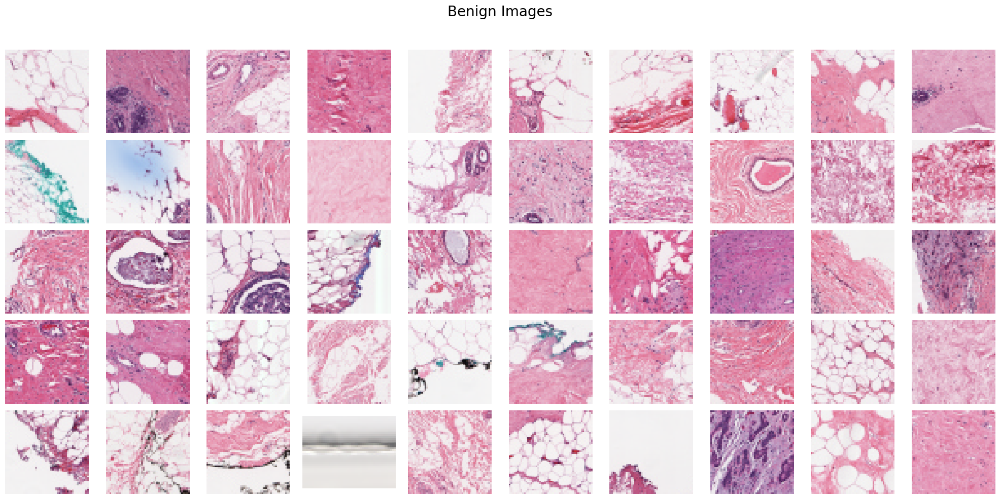

In [9]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Benign Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(train_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

## Exploring the Data Structure of Test Dataset

In [10]:
import os
import pandas as pd

base_path = "/kaggle/input/breast-cancer-images/dataset_cancer_v1/dataset_cancer_v1/classificacao_binaria"
folders = os.listdir(base_path)

records = []

for magnification in folders:                       # 40X, 100X, 200X, 400X
    magnification_path = os.path.join(base_path, magnification)
    
    for cls in ["malignant", "benign"]:
        class_path = os.path.join(magnification_path, cls)
        
        if not os.path.exists(class_path):
            continue
        
        images = os.listdir(class_path)
        
        for img in images:
            img_path = os.path.join(class_path, img)
            
            records.append({
                "path": img_path,
                "target": 1 if cls == "malignant" else 0,
                "magnification": magnification
            })

# Create clean dataframe
test_data = pd.DataFrame(records)

print("Test dataset size:", len(test_data))
test_data.head()


Test dataset size: 7909


,path,target,magnification
0,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
1,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
2,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
3,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
4,/kaggle/input/breast-cancer-images/dataset_can...,1,200X


In [11]:
pos_selection = np.random.choice(test_data[test_data.target == 1].index.values,
                                 size=50, replace=False)

neg_selection = np.random.choice(test_data[test_data.target == 0].index.values,
                                 size=50, replace=False)


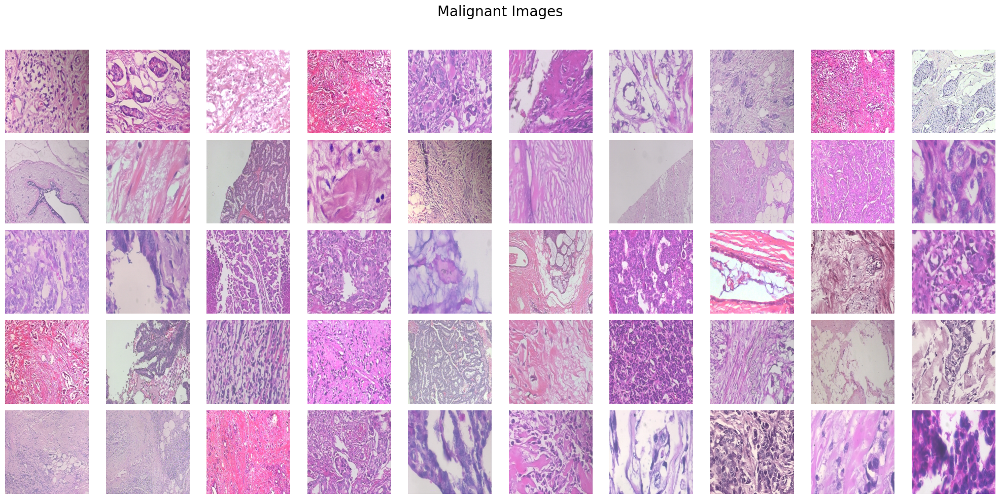

In [12]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Malignant Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10*n]
        image = imread(test_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

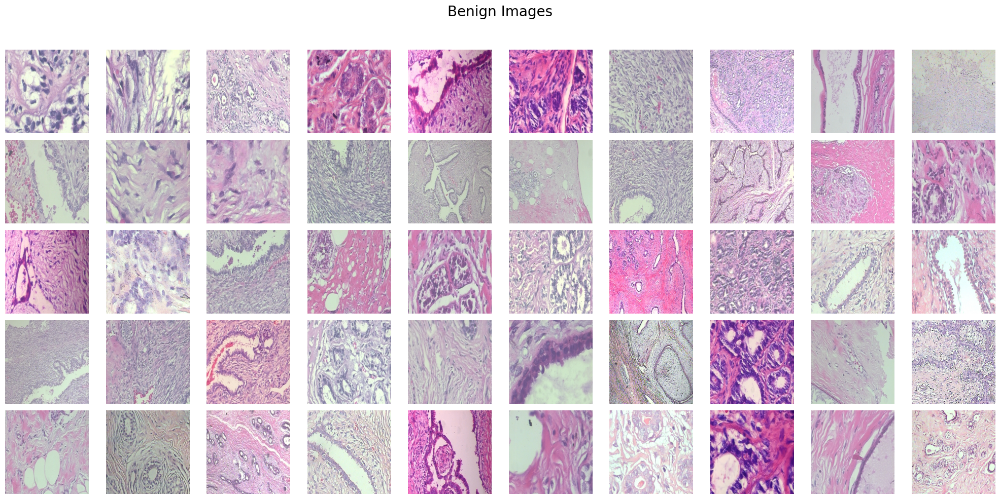

In [13]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Benign Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(test_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

In [14]:
print(test_data['target'].value_counts())


target
1    5429
0    2480
Name: count, dtype: int64


## Merging Both Dataset 

In [15]:
merged_data = pd.concat([train_data, test_data], ignore_index=True)
merged_data = merged_data[['path', 'target']].copy()
merged_data['path'] = merged_data['path'].astype(str)
merged_data['target'] = merged_data['target'].astype(int)

print("Merged size:", len(merged_data))


Merged size: 285433


In [16]:
import numpy as np

malignant_indices = np.random.choice(
    merged_data[merged_data.target == 1].index,
    size=50,
    replace=False
)

benign_indices = np.random.choice(
    merged_data[merged_data.target == 0].index,
    size=50,
    replace=False
)


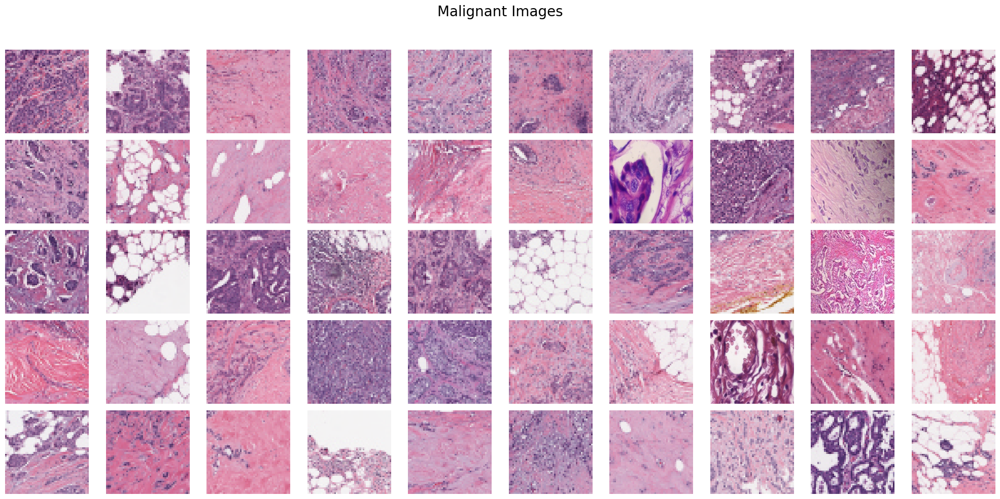

In [17]:
import matplotlib.pyplot as plt
from matplotlib.image import imread

fig, ax = plt.subplots(5, 10, figsize=(20, 10))
fig.suptitle("Malignant Images", fontsize=20)

for i, idx in enumerate(malignant_indices):
    image = imread(merged_data.loc[idx, "path"])
    ax[i//10, i%10].imshow(image)
    ax[i//10, i%10].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


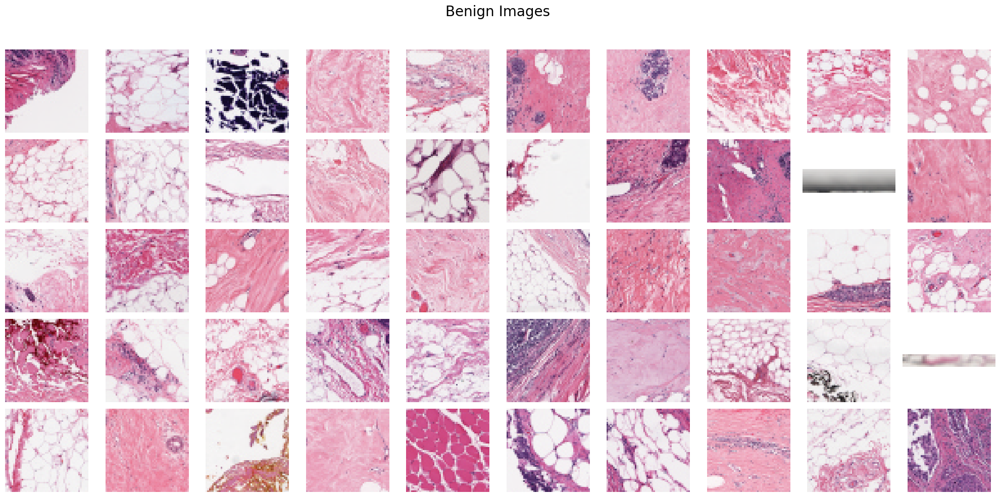

In [18]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))
fig.suptitle("Benign Images", fontsize=20)

for i, idx in enumerate(benign_indices):
    image = imread(merged_data.loc[idx, "path"])
    ax[i//10, i%10].imshow(image)
    ax[i//10, i%10].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## DATA PREPROCESSING AND LOADING OF TRAIN DATASET

## Shifting To GPU

In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device) 

Using device: cuda


## CREATING CUSTOM DATASET USING PYTORCH FRAMEWORK

In [20]:
import  random , os

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
torch.cuda.manual_seed_all(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [21]:
from torch.utils.data import Dataset
from PIL import Image

class BreastCancerDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.df.loc[idx, "path"]
        label = int(self.df.loc[idx, "target"])

        img = Image.open(path).convert("RGB")
        if self.transform:
            img = self.transform(img)

        return img, label


## Advanced Augmentation Pipeline

In [22]:
import torchvision.transforms as T

train_transform = T.Compose([
    T.RandomResizedCrop(224, scale=(0.8, 1.0)),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.15),
    T.RandomGrayscale(p=0.1),
    T.RandomApply([T.GaussianBlur(3)], p=0.3),
    T.RandomAutocontrast(p=0.5),
    T.RandomEqualize(p=0.5),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    T.RandomErasing(p=0.25)
])

test_transform = T.Compose([
    T.Resize((260, 260)),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])


## Train/Test Split


In [23]:
from torch.utils.data import random_split

full_dataset = BreastCancerDataset(merged_data, transform=train_transform)

total = len(full_dataset)
train_size = int(0.70 * total)
val_size   = int(0.15 * total)
test_size  = total - train_size - val_size

generator = torch.Generator().manual_seed(42)
train_subset, val_subset, test_subset = random_split(
    full_dataset, [train_size, val_size, test_size], generator
)

# validation/test use EVAL transforms
val_dataset = BreastCancerDataset(
    merged_data.iloc[val_subset.indices], transform=test_transform
)
test_dataset = BreastCancerDataset(
    merged_data.iloc[test_subset.indices], transform=test_transform
)




In [24]:
print(f"Training images: {len(train_subset)}")
print(f"Validation images: {len(val_dataset)}")
print(f"Test images: {len(test_dataset)}")

Training images: 199803
Validation images: 42814
Test images: 42816


In [25]:
import torch
from torch.utils.data import WeightedRandomSampler

train_labels = merged_data.iloc[train_subset.indices]["target"].values

counts = {
    0: (train_labels == 0).sum(),
    1: (train_labels == 1).sum()
}
print(counts)

weights = {
    0: 1.0 / counts[0],
    1: 1.0 / counts[1]
}

sample_weights = torch.tensor([weights[l] for l in train_labels], dtype=torch.float32)

sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)


{0: 140784, 1: 59019}


## DATALOADER

In [26]:


train_loader = DataLoader(
    train_subset,
    batch_size=64,
    sampler=sampler,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)



In [27]:
images, labels = next(iter(train_loader))

unique, counts = torch.unique(labels, return_counts=True)
print(dict(zip(unique.tolist(), counts.tolist())))


{0: 35, 1: 29}


## COMPARING AUGMENTED IMAGE AND ORIGINAL IMAGE 

In [28]:
import torch

def denormalize(img_tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 1, 3)
    std = torch.tensor(std).reshape(1, 1, 3)
    img = img_tensor.permute(1, 2, 0) * std + mean
    return img.clamp(0, 1)


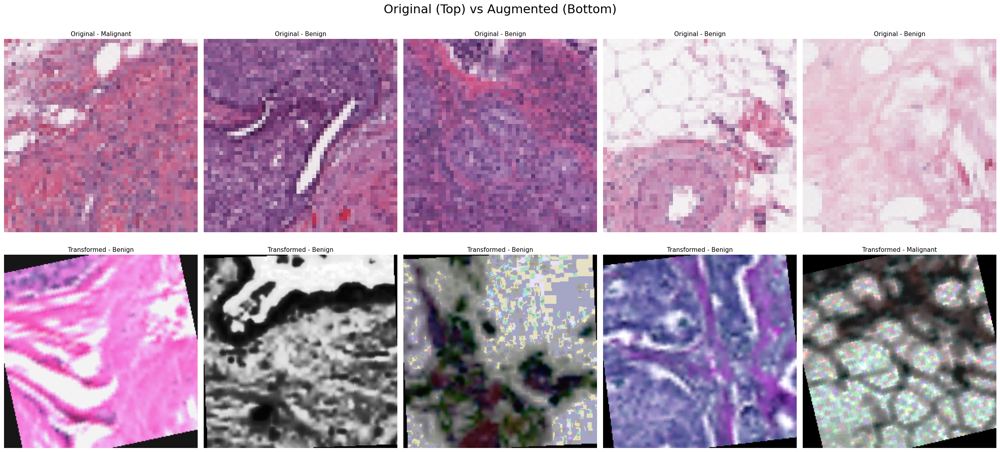

In [29]:
import random
from PIL import Image
import matplotlib.pyplot as plt

# pick 5 random samples from TRAIN dataframe
sample_indices = random.sample(range(len(train_data)), 5)

fig, axes = plt.subplots(2, 5, figsize=(25, 12))

for i, idx in enumerate(sample_indices):

    # ORIGINAL IMAGE PATH
    img_path = train_data.iloc[idx]['path']
    label = train_data.iloc[idx]['target']

    # Read original
    orig = Image.open(img_path).convert("RGB")
    
    axes[0, i].imshow(orig)
    axes[0, i].set_title(f"Original - {'Malignant' if label==1 else 'Benign'}",
                         fontsize=11)
    axes[0, i].axis('off')

# --- NOW SHOW TRANSFORMED IMAGES (AUGMENTED) ---

for i, idx in enumerate(sample_indices):

    # load using train_dataset + transform
    img, label = train_subset[i]     # train_dataset from new pipeline
    
    # convert back to displayable image
    img_np = denormalize(
        img,
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ).numpy()

    axes[1, i].imshow(img_np)
    axes[1, i].set_title(f"Transformed - {'Malignant' if label==1 else 'Benign'}",
                         fontsize=11)
    axes[1, i].axis('off')

plt.suptitle("Original (Top) vs Augmented (Bottom)", fontsize=22)
plt.tight_layout()
plt.show()


## Model Setup (EfficientNetB2)

In [30]:
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
import torch.nn as nn

weights = EfficientNet_B2_Weights.DEFAULT
model = efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)

for param in model.features[:4].parameters():
    param.requires_grad = False

model.classifier[1] = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier[1].in_features, 2)
)

model = model.to(device)


Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 163MB/s]


## Loss, Optimizer, Scheduler

In [31]:
from collections import Counter
import torch

class_counts = Counter(train_labels)

class_weights = torch.tensor(
    [1.0 / class_counts[cls] for cls in sorted(class_counts.keys())],
    dtype=torch.float32
).to(device)

# optional (recommended)
class_weights = class_weights / class_weights.sum()


In [32]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.05)
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=1e-3,
                                                epochs=25, steps_per_epoch=len(train_loader))


## MixUp Integration

In [33]:
import numpy as np
from torch import amp

def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha)
    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)


## Training Loop (Mixed Precision + MixUp)

In [51]:
scaler = amp.GradScaler(device='cuda')
best_val_acc = 0.0

for epoch in range(15):
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        with amp.autocast(device_type='cuda'):
            images, y_a, y_b, lam = mixup_data(images, labels)
            outputs = model(images)
            loss = mixup_criterion(criterion, outputs, y_a, y_b, lam)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()
        running_loss += loss.item() * images.size(0)

    train_acc = correct / total
    scheduler.step()

    # validation
    model.eval()
    val_correct, val_total = 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_acc = val_correct / val_total
    print(f"Epoch {epoch+1}: Train Acc={train_acc:.4f}, Val Acc={val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "efficientnet_best_mixup.pth")
        print(f" Best model saved at epoch {epoch+1} | Val Acc: {val_acc:.4f}")


Epoch 1: Train Acc=0.6383, Val Acc=0.8254
 Best model saved at epoch 1 | Val Acc: 0.8254
Epoch 2: Train Acc=0.6597, Val Acc=0.8301
 Best model saved at epoch 2 | Val Acc: 0.8301
Epoch 3: Train Acc=0.6584, Val Acc=0.8419
 Best model saved at epoch 3 | Val Acc: 0.8419
Epoch 4: Train Acc=0.6696, Val Acc=0.8319
Epoch 5: Train Acc=0.6674, Val Acc=0.8461
 Best model saved at epoch 5 | Val Acc: 0.8461
Epoch 6: Train Acc=0.6674, Val Acc=0.8473
 Best model saved at epoch 6 | Val Acc: 0.8473
Epoch 7: Train Acc=0.6763, Val Acc=0.8338
Epoch 8: Train Acc=0.6725, Val Acc=0.8636
 Best model saved at epoch 8 | Val Acc: 0.8636
Epoch 9: Train Acc=0.6716, Val Acc=0.8484
Epoch 10: Train Acc=0.6783, Val Acc=0.8608
Epoch 11: Train Acc=0.6781, Val Acc=0.8538
Epoch 12: Train Acc=0.6801, Val Acc=0.8455
Epoch 13: Train Acc=0.6812, Val Acc=0.8674
 Best model saved at epoch 13 | Val Acc: 0.8674
Epoch 14: Train Acc=0.6737, Val Acc=0.8760
 Best model saved at epoch 14 | Val Acc: 0.8760
Epoch 15: Train Acc=0.6772, V

## Install & Import Optuna

In [35]:
!pip install optuna --quiet
import optuna
from optuna.trial import TrialState
from torch import amp
import torch.nn as nn
import torch.optim as optim


## Optuna Objective Function

In [36]:
import optuna
from optuna.trial import TrialState
from optuna.exceptions import TrialPruned
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
import numpy as np

def objective(trial):
    # ---- Hyperparameters ----
    lr = trial.suggest_float("lr", 1e-5, 5e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout = trial.suggest_float("dropout", 0.3, 0.6)
    label_smoothing = trial.suggest_float("label_smoothing", 0.0, 0.1)
    mixup_alpha = trial.suggest_float("mixup_alpha", 0.1, 0.4)

    # ---- Model ----
    weights = EfficientNet_B2_Weights.DEFAULT
    model = efficientnet_b2(weights=weights)
    model.classifier[1] = nn.Sequential(
        nn.Dropout(dropout),
        nn.Linear(model.classifier[1].in_features, 2)
    )
    model = model.to(device)

    # Light freezing (speed up)
    for param in model.features[:8].parameters():
        param.requires_grad = False

    criterion = nn.CrossEntropyLoss(label_smoothing=label_smoothing)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    scaler = amp.GradScaler(device="cuda")

    # ---- MixUp ----
    def mixup_data(x, y, alpha=mixup_alpha):
        lam = np.random.beta(alpha, alpha)
        indices = torch.randperm(x.size(0)).to(device)
        return lam * x + (1 - lam) * x[indices], y, y[indices], lam

    def mixup_loss(pred, y1, y2, lam):
        return lam * criterion(pred, y1) + (1 - lam) * criterion(pred, y2)

    # ---- Fewer Epochs (Fast tuning) ----
    EPOCHS = 2

    best_val = 0.0
    for epoch in range(EPOCHS):
        model.train()
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            with amp.autocast(device_type="cuda"):
                mixed_x, y1, y2, lam = mixup_data(images, labels)
                out = model(mixed_x)
                loss = mixup_loss(out, y1, y2, lam)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        # ---- Validation ----
        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                pred = model(images)
                _, p = torch.max(pred, 1)
                correct += (p == labels).sum().item()
                total += labels.size(0)

        val_acc = correct / total
        trial.report(val_acc, epoch)

        # ---- PRUNE BAD TRIALS ----
        if trial.should_prune():
            raise TrialPruned()

        best_val = max(best_val, val_acc)

    return best_val


In [70]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10, timeout=3600)


[I 2025-11-19 15:47:03,655] A new study created in memory with name: no-name-103a5251-9a32-47dc-bd98-9cf144bf123f
[I 2025-11-19 16:28:55,642] Trial 0 finished with value: 0.7820806278320176 and parameters: {'lr': 0.00391165139217012, 'weight_decay': 0.00020906638499073877, 'dropout': 0.43009240363848544, 'label_smoothing': 0.05738860746579105, 'mixup_alpha': 0.3311128487494046}. Best is trial 0 with value: 0.7820806278320176.
[I 2025-11-19 17:12:09,868] Trial 1 finished with value: 0.8244265894333629 and parameters: {'lr': 0.0005456898513668497, 'weight_decay': 0.00030063434434539484, 'dropout': 0.3711906944846201, 'label_smoothing': 0.03873874915695363, 'mixup_alpha': 0.3846742535497669}. Best is trial 1 with value: 0.8244265894333629.


In [71]:
print("Best Trial:")
trial = study.best_trial

print(f"  Accuracy: {trial.value:.4f}")
for key, value in trial.params.items():
    print(f"    {key}: {value}")


Best Trial:
  Accuracy: 0.8244
    lr: 0.0005456898513668497
    weight_decay: 0.00030063434434539484
    dropout: 0.3711906944846201
    label_smoothing: 0.03873874915695363
    mixup_alpha: 0.3846742535497669


In [72]:
import optuna.visualization as vis

fig1 = vis.plot_optimization_history(study)
fig1.show()

fig2 = vis.plot_param_importances(study)
fig2.show()

fig3 = vis.plot_parallel_coordinate(study)
fig3.show()


## Retraining Final Model Using Best Params

In [73]:
best_params = study.best_trial.params
print(best_params)

# Final Model
weights = EfficientNet_B2_Weights.DEFAULT
model = efficientnet_b2(weights=weights)
model.classifier[1] = nn.Sequential(
    nn.Dropout(best_params['dropout']),
    nn.Linear(model.classifier[1].in_features, 2)
)
model = model.to(device)

criterion = nn.CrossEntropyLoss(label_smoothing=best_params['label_smoothing'])
optimizer = optim.AdamW(model.parameters(),
                        lr=best_params['lr'],
                        weight_decay=best_params['weight_decay'])
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=15)
scaler = amp.GradScaler(device='cuda')

EPOCHS = 12
best_val_acc = 0.0


{'lr': 0.0005456898513668497, 'weight_decay': 0.00030063434434539484, 'dropout': 0.3711906944846201, 'label_smoothing': 0.03873874915695363, 'mixup_alpha': 0.3846742535497669}


In [74]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
from tqdm import tqdm
import numpy as np


best_params = {
    'lr': 0.00022939220169551682,
    'weight_decay': 1.7828157864794455e-05,
    'dropout': 0.4995627325190859,
    'label_smoothing': 0.03848634573644608,
    'mixup_alpha': 0.1741251709299936
}


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

weights = EfficientNet_B2_Weights.DEFAULT
model = efficientnet_b2(weights=weights)
model.classifier[1] = nn.Sequential(
    nn.Dropout(best_params['dropout']),
    nn.Linear(model.classifier[1].in_features, 2)
)
model = model.to(device)


criterion = nn.CrossEntropyLoss(label_smoothing=best_params['label_smoothing'])
optimizer = optim.AdamW(model.parameters(),
                        lr=best_params['lr'],
                        weight_decay=best_params['weight_decay'])
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=15)

scaler = torch.amp.GradScaler('cuda')


def mixup_data(x, y, alpha):
    lam = np.random.beta(alpha, alpha)
    index = torch.randperm(x.size(0)).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)


EPOCHS = 12
best_val_acc = 0.0
patience = 4
trigger_times = 0

for epoch in range(EPOCHS):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    
    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{EPOCHS}]")
    
    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        
        with torch.amp.autocast('cuda'):   
            mixed_x, y_a, y_b, lam = mixup_data(images, labels, best_params['mixup_alpha'])
            outputs = model(mixed_x)
            loss = mixup_criterion(criterion, outputs, y_a, y_b, lam)
        
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
        
        loop.set_postfix(loss=loss.item())
    
    train_loss = running_loss / total
    train_acc = correct / total

   
    model.eval()
    val_correct, val_total, val_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            with torch.amp.autocast('cuda'):   
                outputs = model(images)
                loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)
    
    val_loss /= val_total
    val_acc = val_correct / val_total
    scheduler.step()

    print(f"\nEpoch [{epoch+1}/{EPOCHS}] | "
          f"Train Acc: {train_acc:.4f}, Train Loss: {train_loss:.4f} | "
          f"Val Acc: {val_acc:.4f}, Val Loss: {val_loss:.4f}")

    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "efficientnet_final_best.pth")
        print(f" Best model saved at epoch {epoch+1} | Val Acc: {val_acc:.4f}")
        trigger_times = 0
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(" Early stopping triggered!")
            break

print(f"\n Final Training Complete! Best Validation Accuracy: {best_val_acc:.4f}")


Epoch [1/12]: 100%|██████████| 3122/3122 [22:42<00:00,  2.29it/s, loss=0.495]



Epoch [1/12] | Train Acc: 0.6747, Train Loss: 0.4677 | Val Acc: 0.8806, Val Loss: 0.3352
 Best model saved at epoch 1 | Val Acc: 0.8806


Epoch [2/12]: 100%|██████████| 3122/3122 [22:33<00:00,  2.31it/s, loss=0.417]



Epoch [2/12] | Train Acc: 0.6757, Train Loss: 0.4301 | Val Acc: 0.8892, Val Loss: 0.3140
 Best model saved at epoch 2 | Val Acc: 0.8892


Epoch [3/12]: 100%|██████████| 3122/3122 [21:34<00:00,  2.41it/s, loss=0.334]



Epoch [3/12] | Train Acc: 0.6815, Train Loss: 0.4160 | Val Acc: 0.8937, Val Loss: 0.3022
 Best model saved at epoch 3 | Val Acc: 0.8937


Epoch [4/12]: 100%|██████████| 3122/3122 [21:02<00:00,  2.47it/s, loss=0.278]



Epoch [4/12] | Train Acc: 0.6860, Train Loss: 0.4114 | Val Acc: 0.8862, Val Loss: 0.3209


Epoch [5/12]: 100%|██████████| 3122/3122 [21:41<00:00,  2.40it/s, loss=0.309]



Epoch [5/12] | Train Acc: 0.6931, Train Loss: 0.3993 | Val Acc: 0.9007, Val Loss: 0.2961
 Best model saved at epoch 5 | Val Acc: 0.9007


Epoch [6/12]: 100%|██████████| 3122/3122 [21:11<00:00,  2.45it/s, loss=0.607]



Epoch [6/12] | Train Acc: 0.6928, Train Loss: 0.3946 | Val Acc: 0.9023, Val Loss: 0.2950
 Best model saved at epoch 6 | Val Acc: 0.9023


Epoch [7/12]: 100%|██████████| 3122/3122 [21:27<00:00,  2.43it/s, loss=0.397]



Epoch [7/12] | Train Acc: 0.6947, Train Loss: 0.3901 | Val Acc: 0.9028, Val Loss: 0.2934
 Best model saved at epoch 7 | Val Acc: 0.9028


Epoch [8/12]: 100%|██████████| 3122/3122 [21:11<00:00,  2.46it/s, loss=0.4]  



Epoch [8/12] | Train Acc: 0.6976, Train Loss: 0.3819 | Val Acc: 0.9033, Val Loss: 0.2914
 Best model saved at epoch 8 | Val Acc: 0.9033


Epoch [9/12]: 100%|██████████| 3122/3122 [20:52<00:00,  2.49it/s, loss=0.273]



Epoch [9/12] | Train Acc: 0.6956, Train Loss: 0.3797 | Val Acc: 0.9064, Val Loss: 0.2853
 Best model saved at epoch 9 | Val Acc: 0.9064


Epoch [10/12]: 100%|██████████| 3122/3122 [20:46<00:00,  2.50it/s, loss=0.183]



Epoch [10/12] | Train Acc: 0.6969, Train Loss: 0.3757 | Val Acc: 0.8989, Val Loss: 0.2943


Epoch [11/12]: 100%|██████████| 3122/3122 [20:43<00:00,  2.51it/s, loss=0.318]



Epoch [11/12] | Train Acc: 0.7031, Train Loss: 0.3723 | Val Acc: 0.9026, Val Loss: 0.2874


Epoch [12/12]: 100%|██████████| 3122/3122 [20:49<00:00,  2.50it/s, loss=0.44] 



Epoch [12/12] | Train Acc: 0.7026, Train Loss: 0.3689 | Val Acc: 0.9083, Val Loss: 0.2813
 Best model saved at epoch 12 | Val Acc: 0.9083

 Final Training Complete! Best Validation Accuracy: 0.9083


## Load Saved Model With Same Architecture

In [40]:
import torch
import torch.nn as nn
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

best_params = {
    'dropout': 0.4995627325190859
}

# Load EfficientNet-B2 backbone
weights = EfficientNet_B2_Weights.DEFAULT
model = efficientnet_b2(weights=weights)

# IMPORTANT: classifier MUST match your training code
model.classifier[1] = nn.Sequential(
    nn.Dropout(best_params['dropout']),
    nn.Linear(model.classifier[1].in_features, 2)
)

# Load saved weights
model.load_state_dict(torch.load("/kaggle/input/efficientnet-final-best/efficientnet_final_best.pth", map_location=device))

model = model.to(device)
model.eval()

print("Model Loaded Successfully!")


Model Loaded Successfully!


## Computing Test Accuracy

In [41]:
correct = 0
total = 0
test_loss = 0.0

criterion = nn.CrossEntropyLoss()

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)

        with torch.amp.autocast('cuda'):  
            outputs = model(images)
            loss = criterion(outputs, labels)

        test_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

test_loss /= total
test_acc = correct / total * 100

print(f"\nTest Accuracy: {test_acc:.2f}%")
print(f"Test Loss: {test_loss:.4f}")



Test Accuracy: 95.91%
Test Loss: nan


## Confusion Matrix + Report

In [42]:
from sklearn.metrics import confusion_matrix, classification_report

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()

        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print("\nCONFUSION MATRIX:")
print(confusion_matrix(all_labels, all_preds))

print("\nCLASSIFICATION REPORT:")
print(classification_report(all_labels, all_preds, target_names=["Benign", "Malignant"]))



CONFUSION MATRIX:
[[29587   666]
 [ 1086 11477]]

CLASSIFICATION REPORT:
              precision    recall  f1-score   support

      Benign       0.96      0.98      0.97     30253
   Malignant       0.95      0.91      0.93     12563

    accuracy                           0.96     42816
   macro avg       0.95      0.95      0.95     42816
weighted avg       0.96      0.96      0.96     42816



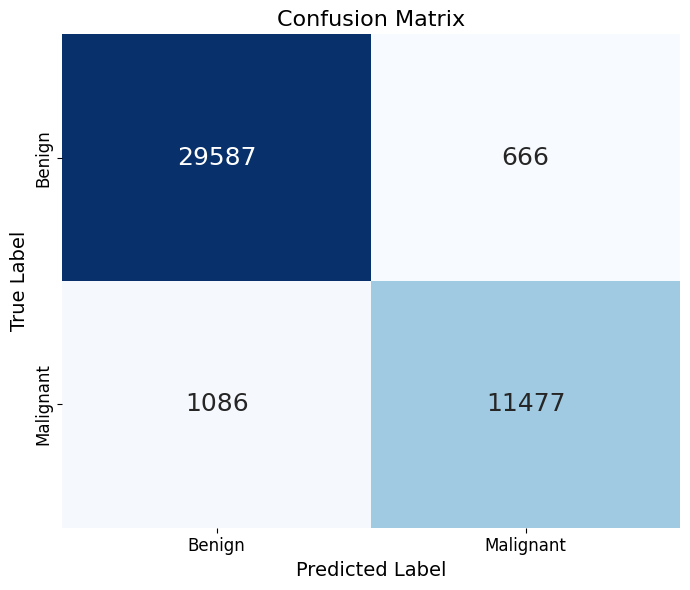

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# compute cm
cm = confusion_matrix(all_labels, all_preds)

# class names
classes = ["Benign", "Malignant"]

plt.figure(figsize=(7,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=classes, yticklabels=classes,
            cbar=False, annot_kws={"size": 18})

plt.xlabel("Predicted Label", fontsize=14)
plt.ylabel("True Label", fontsize=14)
plt.title("Confusion Matrix", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


## ROC Curve + AUC Score

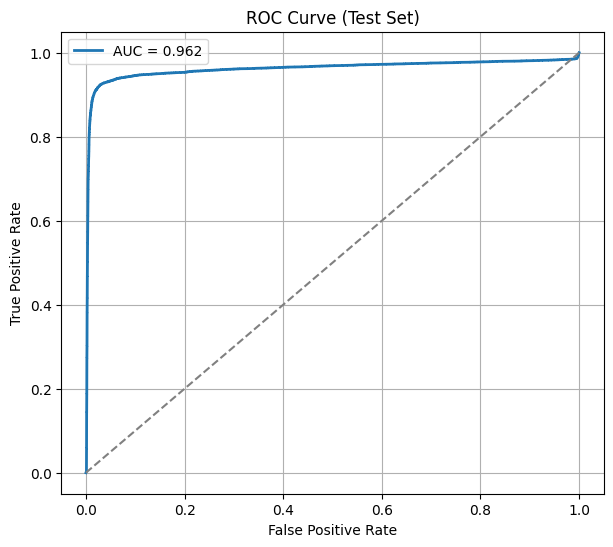

In [43]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import torch.nn.functional as F

all_probs = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)

        probs = F.softmax(outputs, dim=1)[:, 1].cpu().numpy()  # probability of malignant
        all_probs.extend(probs)
        all_labels.extend(labels.numpy())

fpr, tpr, thresholds = roc_curve(all_labels, all_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Test Set)")
plt.legend()
plt.grid(True)
plt.show()


## Visualize Correct & Wrong Predictions

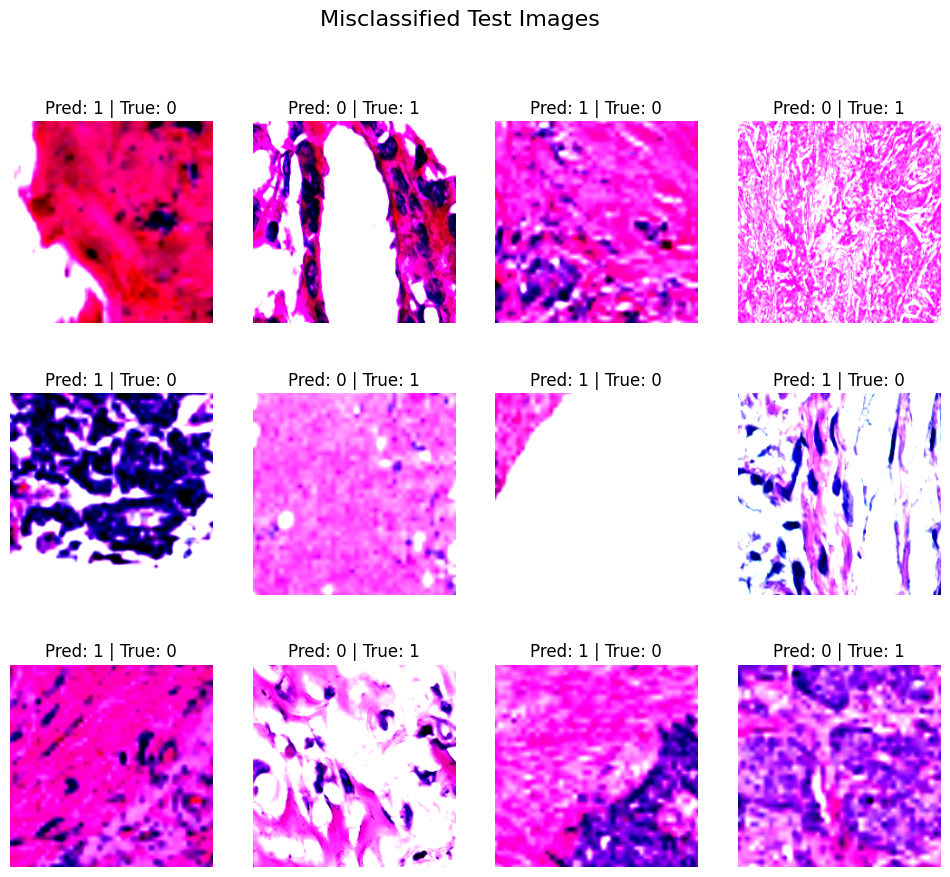

In [44]:
import matplotlib.pyplot as plt
import numpy as np

def show_image(img_tensor):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = np.clip(img, 0, 1)
    return img

wrong_images = []
wrong_preds = []
true_labels = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(1)

        wrong_idx = (preds != labels.to(device))
        for i in range(images.size(0)):
            if wrong_idx[i]:
                wrong_images.append(images[i].cpu())
                wrong_preds.append(preds[i].item())
                true_labels.append(labels[i].item())

        if len(wrong_images) >= 12:
            break

# Plot first 12 wrong predictions
plt.figure(figsize=(12, 10))
for i in range(12):
    plt.subplot(3, 4, i+1)
    plt.imshow(show_image(wrong_images[i]))
    plt.title(f"Pred: {wrong_preds[i]} | True: {true_labels[i]}")
    plt.axis("off")
plt.suptitle("Misclassified Test Images", fontsize=16)
plt.show()


## LayerCAM for EfficientNet-B2

In [75]:
target_layer = model.features[4][0]   # BEST layer for EfficientNet-B2

lc = LayerCAM(model, target_layer)
cam = lc.generate(img)

## Appling LayerCAM on 1 test image:

In [74]:
import torch
import numpy as np
import cv2

class LayerCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        
        # Hooks
        self.fwd = target_layer.register_forward_hook(self.save_activation)
        self.bwd = target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()   # FIXED

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()   # FIXED

    def generate(self, input_tensor):
        # Forward
        output = self.model(input_tensor)

        # Pick predicted class
        class_idx = output.argmax(dim=1).item()

        # Backward
        self.model.zero_grad()
        output[0, class_idx].backward()

        # Activations & gradients: [C,H,W]
        act = self.activations[0]          # shape (C,H,W)
        grad = self.gradients[0]           # shape (C,H,W)

        # LayerCAM formula
        cam = torch.relu(grad * act).sum(dim=0).cpu().numpy()   # FIXED

        # Normalize + Resize
        cam = cv2.resize(cam, (224, 224))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-9)
        return cam


In [76]:
cam_uint8 = (cam * 255).astype(np.uint8)

heatmap = cv2.applyColorMap(cam_uint8, cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

overlay = (0.4 * heatmap/255 + orig)
overlay = np.clip(overlay, 0, 1)


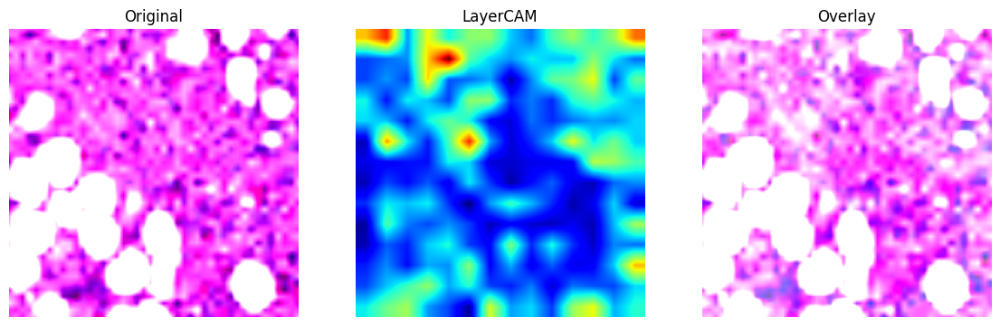

In [77]:
plt.figure(figsize=(14,5))
plt.subplot(1,3,1); plt.title("Original"); plt.imshow(orig); plt.axis("off")
plt.subplot(1,3,2); plt.title("LayerCAM"); plt.imshow(cam, cmap='jet'); plt.axis("off")
plt.subplot(1,3,3); plt.title("Overlay"); plt.imshow(overlay); plt.axis("off")
plt.show()


## Complete Metrics Summary

In [61]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print("\nFinal Test Accuracy: ", accuracy_score(all_labels, all_preds))

print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=["Benign", "Malignant"]))

print("\nConfusion Matrix:")
print(confusion_matrix(all_labels, all_preds))



Final Test Accuracy:  0.9590807174887892

Classification Report:
              precision    recall  f1-score   support

      Benign       0.96      0.98      0.97     30253
   Malignant       0.95      0.91      0.93     12563

    accuracy                           0.96     42816
   macro avg       0.95      0.95      0.95     42816
weighted avg       0.96      0.96      0.96     42816


Confusion Matrix:
[[29587   666]
 [ 1086 11477]]
